[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/mdehling/neural-style-transfer/blob/main/gatys2015.ipynb)

# Introduction
In this notebook I will reproduce the results of the seminal works of Gatys et al on texture synthesis (_Texture Synthesis Using Convolutional Neural Networks_ [1]) and neural style transfer (_A Neural Algorithm of Artistic Style_ [2]), and I will go through some of the many variations and improvements of the original algorithm suggested by Gatys et al and other authors.

In [1]:
try:
    from google import colab
    RUNNING_ON_COLAB = True

    !git init .
    !git remote add origin https://github.com/mdehling/neural-style-transfer.git
    !git pull origin main
    !git submodule update --init

    %pip install -r nstesia/requirements.txt

except:
    RUNNING_ON_COLAB = False

In [2]:
from os import environ as env
env['TF_CPP_MIN_LOG_LEVEL'] = '2'           # hide info & warnings
env['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'   # grow GPU memory as needed

import tensorflow as tf
import matplotlib.pyplot as plt

import nstesia as nst

# Texture Synthesis and Style Loss
The idea behind texture synthesis is to generate an image with similar texture/style to a given sample.  It can be viewed as a preliminary step to neural style transfer.  The main insight of Gatys' article [1] is that texture/style can be represented by the correlations between feature maps in several layers of a CNN trained for image recognition.  In the original work, the correlations are measured by the Gram matrix of the filter responses to certain layers in a VGG19 network trained on the ImageNet dataset.  I will give a brief overview of how this is done here.

Denote by $F^l \in \mathbf{R}^{N_l\times M_l}$ the feature vector (output) produced by layer $l$ of the CNN, where $N_l$ is the number of filters in layer $l$ and $M_l$ the size of the output in number of pixels.  The averaged Gram matrix $G^l \in \mathbf{R}^{N_l\times N_l}$ of $F^l$ is defined by
$$ G^l_{rs} = \frac{1}{M_l} \big\langle F^l_{r:} \big| F^l_{s:} \big\rangle = \frac{1}{M_l} \sum_i F^l_{ri} F^l_{si} \quad. $$
Now let $\hat{G}^l$ be the averaged Gram tensor for the provided style image and $G^l$ that for the generated image.  The layer $l$ component of the style loss is
$$ \mathcal{L}_S^l = \frac{1}{N_l^2} \big\| G^l - \hat{G}^l \big\|_F^2 = \frac{1}{N_l^2} \sum_{r,s} \big( G^l_{rs} - \hat{G}^l_{rs} \big)^2 $$
and the overall style loss $\mathcal{L}_S$ is defined as the mean of these layer components.

(Note that I have modified the normalization factor from Gatys' work: the choice in the original article has the unfortunate consequence that the magnitude of the style loss depends on the size of the image.)

The class [`nstesia.models.GatysStyle`](https://github.com/mdehling/nstesia/blob/main/losses/gatys_style.py) provides an implementation of the style loss as described above.  Its initializer takes an argument specifying the CNN to use; see below for examples.

Now to use the Style loss to generate images imitating the texture/style of a given sample, Gatys proposed an iterative process where, starting from random noise, at each iteration the gradient of the style loss function with respect to the image is computed and the current image is modified to reduce the loss using standard optimization techniques (SGD, Adam, ...)  I have implemented a simple version of this approach in the class [`nstesia.applications.ImageGenerator`](https://github.com/mdehling/nstesia/blob/main/applications/image_generator.py).  The optimization loop looks essentially like this:

    for n in range(steps):
        for m in range(iterations_per_step):
            loss, grad = compute_gradients()
            optimizer.apply_gradients([(grad, image)])
            image.assign(tf.clip_by_value(image, 0.0, 255.0))

The `ImageGenerator` class does a few more things like keeping track of losses over time and saving a copy of the image at the end of each step.

Let me show you an example of texture synthesis!  I will use SGD as an optimizer; it should work well enough.  The first step is to determine the learning rate.

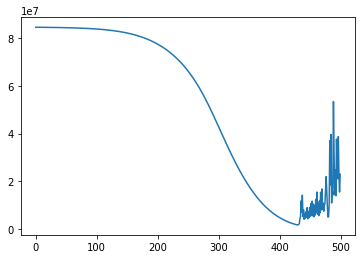

In [3]:
style_image = nst.utils.image.load_images('img/pebbles.jpeg', min_dim=256)

optimizer = tf.keras.optimizers.SGD(
    tf.keras.optimizers.schedules.ExponentialDecay(1e-5, 100, 10.0)
)
loss = nst.losses.GatysStyle(style_image, model='vgg19:gatys2015a-1')

imgen = nst.applications.ImageGenerator(
    tf.random.uniform((1,256,256,3), 0.0, 255.0),
    optimizer=optimizer, loss=loss
)

imgen(steps=5)
plt.plot(imgen.losses)

After just over 400 iterations the loss starts to diverge, meaning a learning rate of around 0.1 is close to optimal.  I'll run the same thing again with that learning rate and see what happens.

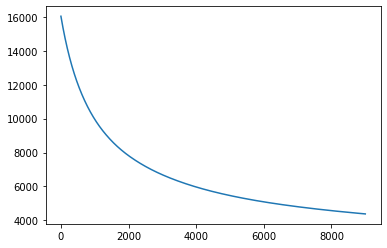

In [4]:
imgen = nst.applications.ImageGenerator(
    tf.random.uniform((1,256,256,3), 0.0, 255.0),
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.1, momentum=0.9),
    loss=nst.losses.GatysStyle(style_image, model='vgg19:gatys2015a-1')
)
imgen(steps=100)
plt.plot(imgen.losses[1000:])

It looks like the loss is decreasing nicely and the results below don't look so bad.  The generated images are a little grainy, but that can be improved by adding some regularization in the next section.

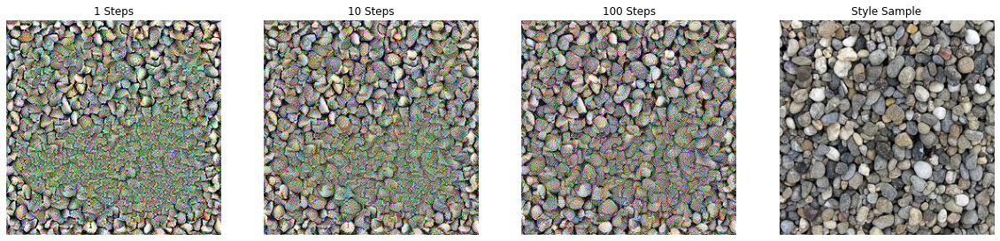

In [5]:
nst.utils.image.show_images(
    [ imgen.images[i-1] for i in [1,10,100] ] + [style_image],
    titles = [f'{i} Steps' for i in [1,10,100]] + ['Style Sample']
)

# Image Noise and Variation Loss
A common way to remove noise from the generated image is to introduce an additional term to the total loss function: the variation loss.  From the TensorFlow API documentation:

> The total variation is the sum of the absolute differences for neighboring pixel-values in the input images. This measures how much noise is in the images.

Explicitly, the (anisotropic) [total variation](https://en.wikipedia.org/wiki/Total_variation_denoising#2D_signal_images) of an image with pixels $X_{i,j}$ is defined as

$$ V(X) = \sum_{i,j} |X_{i+1,j}-X_{i,j}| + |X_{i,j+1}-X_{i,j}| \quad. $$

A function computing the total variation of an image tensor is built in to TensorFlow.  The [`nstesia.losses.Variation`](https://github.com/mdehling/nstesia/blob/main/losses/variation.py) class is a little wrapper to make it usable as a loss function here.

The following cell generates another image in the style of the pebbles sample, this time with variation loss (weight `1e-3`).  It should look a little less grainy than the image in the previous section.

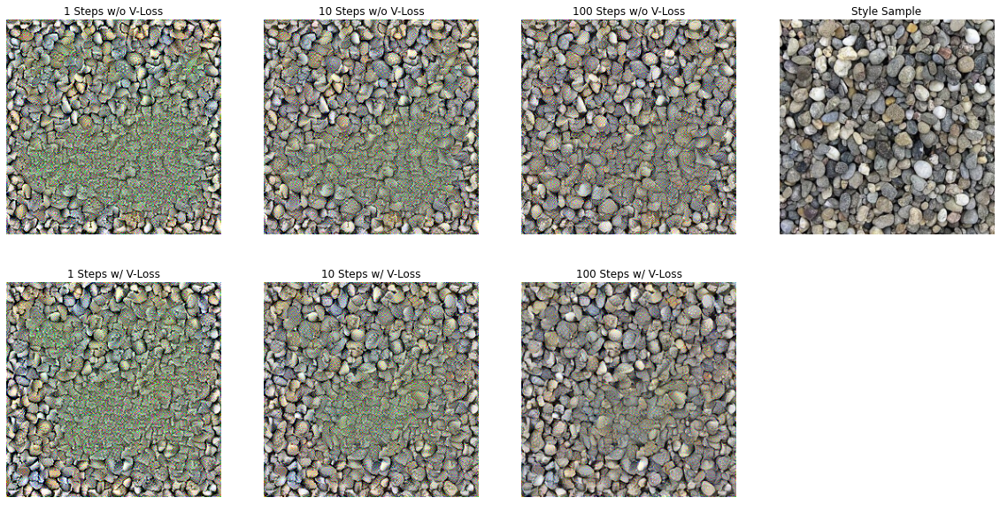

In [6]:
imgen_v = nst.applications.ImageGenerator(
    tf.random.uniform((1,256,256,3), 0.0, 255.0),
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.1, momentum=0.9),
    loss=nst.losses.Total([ nst.losses.GatysStyle(style_image, model='vgg19:gatys2015a-1'),
                            nst.losses.Variation() ], weights=[1.0, 1e-3] )
)
imgen_v(steps=100)

nst.utils.image.show_images(
    [ imgen.images[i-1] for i in [1,10,100] ] + [style_image]
        + [ imgen_v.images[i-1] for i in [1,10,100] ],
    titles = [f'{i} Steps w/o V-Loss' for i in [1,10,100]] + ['Style Sample']
        + [f'{i} Steps w/ V-Loss' for i in [1,10,100]]
)

As I mentioned earlier, the `model` parameter to the style loss can be set to choose which CNN to use as the base model for the Gram tensor computations.  Gatys worked with a VGG19 model and used the outputs of all layers of the first 4 blocks.  Other authors have chosen to work with different models or use a different subset of layers.  Below is a comparison of the results using all layers of the first 4 blocks of a VGG19 model vs using one layer of each block of a VGG16 model.  In both cases the model was trained for image recognition on the ImageNet dataset.

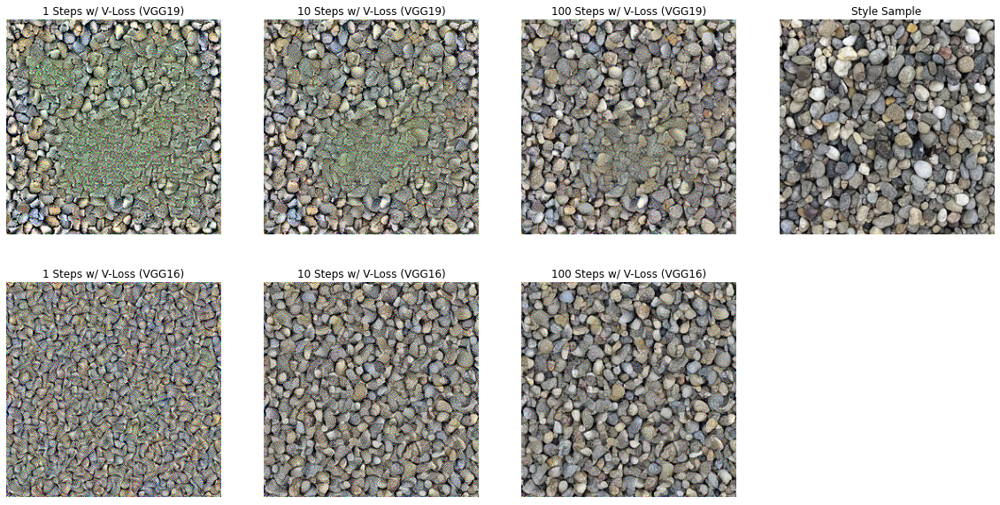

In [7]:
imgen_v_16 = nst.applications.ImageGenerator(
    tf.random.uniform((1,256,256,3), 0.0, 255.0),
    optimizer=tf.keras.optimizers.SGD(learning_rate=1.0, momentum=0.9),
    loss=nst.losses.Total([ nst.losses.GatysStyle(style_image, model='vgg16:johnson2016'),
                            nst.losses.Variation() ], weights=[1.0, 1e-4] )
)
imgen_v_16(steps=100)

nst.utils.image.show_images(
    [ imgen_v.images[i-1] for i in [1,10,100] ] + [style_image]
        + [ imgen_v_16.images[i-1] for i in [1,10,100] ],
    titles = [f'{i} Steps w/ V-Loss (VGG19)' for i in [1,10,100]] + ['Style Sample']
        + [f'{i} Steps w/ V-Loss (VGG16)' for i in [1,10,100]]
)

In my opinion the results using VGG16 look better, at least with the relatively short training time I use here.  For this reason I have chosen to work with VGG16 for most of this notebook.

Here is another example of a style image and the regularizing effects of variation loss.

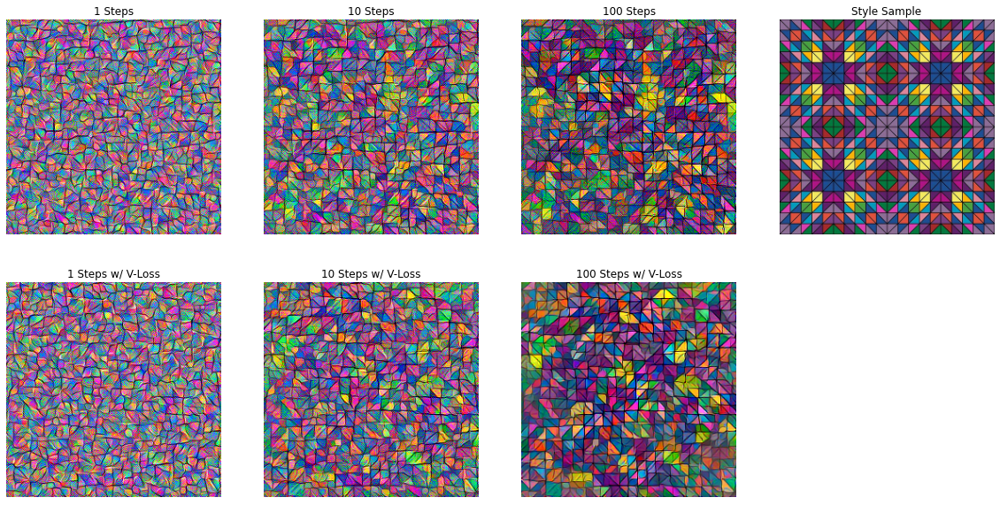

In [8]:
style_image = nst.utils.image.load_images('img/triangles.jpeg', min_dim=256)

imgen = nst.applications.ImageGenerator(
    tf.random.uniform((1,256,256,3), 0.0, 255.0),
    optimizer=tf.keras.optimizers.SGD(learning_rate=1.0, momentum=0.9),
    loss=nst.losses.GatysStyle(style_image, model='vgg16:johnson2016')
)
imgen(steps=100)

imgen_v = nst.applications.ImageGenerator(
    tf.random.uniform((1,256,256,3), 0.0, 255.0),
    optimizer=tf.keras.optimizers.SGD(learning_rate=1.0, momentum=0.9),
    loss=nst.losses.Total([ nst.losses.GatysStyle(style_image, model='vgg16:johnson2016'),
                            nst.losses.Variation() ], weights=[1.0, 3e-4] )
)
imgen_v(steps=100)

nst.utils.image.show_images(
    [ imgen.images[i-1] for i in [1,10,100] ] + [style_image]
        + [ imgen_v.images[i-1] for i in [1,10,100] ],
    titles = [f'{i} Steps' for i in [1,10,100]] + ['Style Sample']
        + [f'{i} Steps w/ V-Loss' for i in [1,10,100]]
)

# Long-Range Structure and Cross-Correlation Loss
The Gram tensor measures correlation of filter activations locally but does not take long-range structure into account.  Consider the following style sample showing a brick wall and the results of texture synthesis for it.

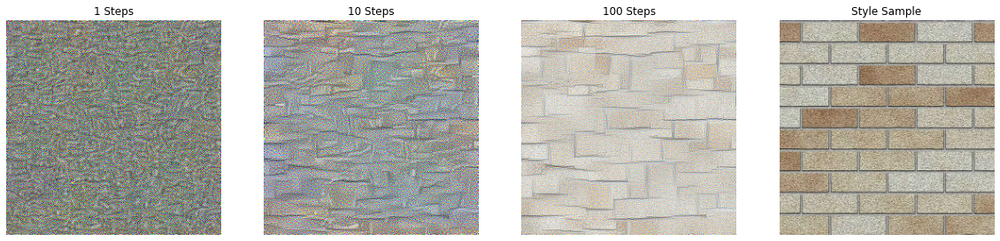

In [9]:
style_image = nst.utils.image.load_images('img/wall.jpeg', min_dim=256)

imgen = nst.applications.ImageGenerator(
    tf.random.uniform((1,256,256,3), 0.0, 255.0),
    optimizer=tf.keras.optimizers.SGD(learning_rate=1.0, momentum=0.9),
    loss=nst.losses.Total([ nst.losses.GatysStyle(style_image, model='vgg16:johnson2016'),
                            nst.losses.Variation() ], weights=[1.0, 1e-4] )
)
imgen(steps=100)

nst.utils.image.show_images(
    [ imgen.images[i-1] for i in [1,10,100] ] + [style_image],
    titles = [f'{i} Steps' for i in [1,10,100]] + ['Style Sample']
)

Cross-correlation loss was defined by Berger and Memisevic in their article _Incorporating Long-Range Consistency in CNN-Based Texture Generation_ [3].  They propose to add another loss term similar to the style loss which they call the cross-correlation loss.  The way it takes long-range structure into account is by considering the correlations between filter responses in different locations of the image.

Denote by $T_{(\delta_x,\delta_y)}$ the translation operator.  Applying it to an image shifts it by $\delta_x$ pixels along the $x$-axis and by $\delta_y$ along the $y$-axis.  Now denote by $G^l_{(\delta_x,\delta_y)}$ the modified Gram tensor with components
$$ G^l_{(\delta_x,\delta_y),rs} = \frac{1}{M_l} \big\langle T_{(-\delta_x,-\delta_y)}(F^l_{r:}) \big| T_{(\delta_x,\delta_y)}(F^l_{s:}) \big\rangle \quad. $$
This tensor measures correlation between filter responses $(2\delta_x,2\delta_y)$ apart.

The layer $l$ component of the cross-correlation loss for some $\delta$ is then defined as
$$ \mathcal{L}^l_{\text{cc},\delta} = \frac{1}{2N_l^2} \Big( \Big\Vert G^l_{(\delta,0)} - \hat{G}^l_{(\delta,0)} \Big\Vert^2 + \Big\Vert G^l_{(0,\delta)} - \hat{G}^l_{(0,\delta)} \Big\Vert^2 \Big) \quad, $$
and the overall cross-correlation loss is simply the mean of the layer components.

(I have changed the normalization factor from the original article so that for $\delta=0$ the cross-correlation loss is the same as the style loss.)

For my implementation of cross-correlation loss, see [`nstesia.losses.CrossCorrelation`](https://github.com/mdehling/nstesia/blob/main/losses/crosscorrelation.py).  Its initializer takes a list of tuples of transformations to apply on the left/right in the scalar product of the Gram tensor.  Note that there is nothing special about the translation operator used above and examples using different operators follow below.

The following function returns the translation operator $T_{(\delta_x,\delta_y)}$ given a pair $(\delta_x,\delta_y)$.  This is implemented in the most naive way possible, simply by providing a smaller (by $\delta_x$, $\delta_y$) view of the tensor.

In [10]:
def T_d(dx, dy):
    """Translation operator."""
    def T(Fl):
        height = tf.shape(Fl)[1]
        width = tf.shape(Fl)[2]

        if dx < 0:  x1 = 0;  x2 = width + dx
        else:       x1 = dx; x2 = width

        if dy < 0:  y1 = 0;  y2 = height + dy
        else:       y1 = dy; y2 = height

        return Fl[:,y1:y2,x1:x2,:]

    return T

In the following cell I use the translation operator to take correlation between filter responses shifted along the horizontal or vertical axes into account.  The generated image is a significant improvement over the result without cross-correlation loss!

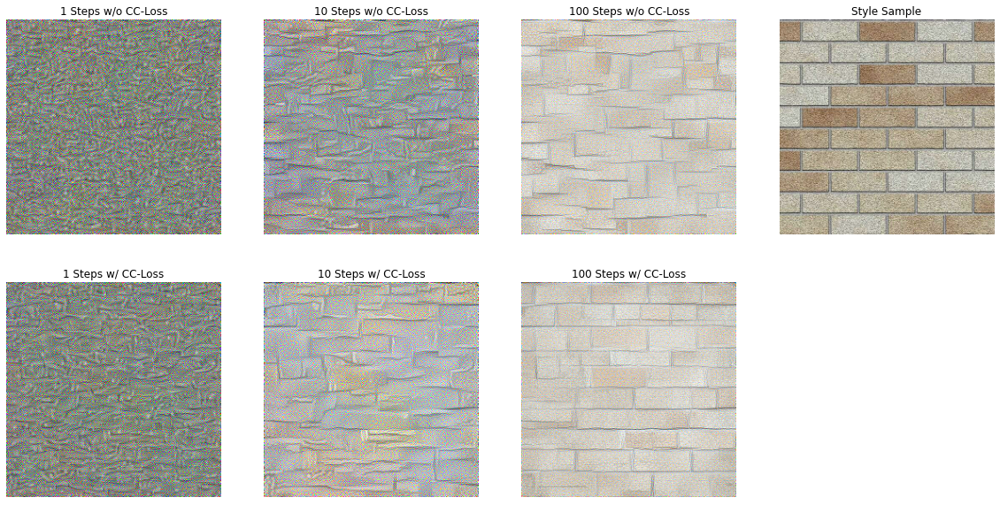

In [11]:
imgen_cc = nst.applications.ImageGenerator(
    tf.random.uniform((1,256,256,3), 0.0, 255.0),
    optimizer=tf.keras.optimizers.SGD(learning_rate=1.0, momentum=0.9),
    loss=nst.losses.Total([
            nst.losses.GatysStyle(style_image, model='vgg16:johnson2016'),
            nst.losses.Variation(),
            nst.losses.CrossCorrelation(style_image, [
                    (T_d(-dx,-dy),T_d(dx,dy))
                    for dx, dy in [  (4,0), (8,0), (16,0), (32,0), (0,2), (0,4), (0,8), (0,16) ]
                ], model='vgg16:johnson2016')
        ], weights=[1.0, 1e-4, 1.0])
)
imgen_cc(steps=100)

nst.utils.image.show_images(
    [ imgen.images[i-1] for i in [1,10,100] ] + [style_image]
        + [ imgen_cc.images[i-1] for i in [1,10,100] ],
    titles = [f'{i} Steps w/o CC-Loss' for i in [1,10,100]] + ['Style Sample']
        + [f'{i} Steps w/ CC-Loss' for i in [1,10,100]]
)

The symmetry operators defined below can be used to measure the correlation between filter responses in an image with the responses in a mirrored (with respect to the x-/y-axis) position.

In [12]:
def id(Fl):
    """Identity transformation."""
    return Fl

def Sx(Fl):
    """Flip along y-axis for x-symmetry."""
    return tf.reverse(Fl, [1])

def Sy(Fl):
    """Flip along x-axis for y-symmetry."""
    return tf.reverse(Fl, [2])

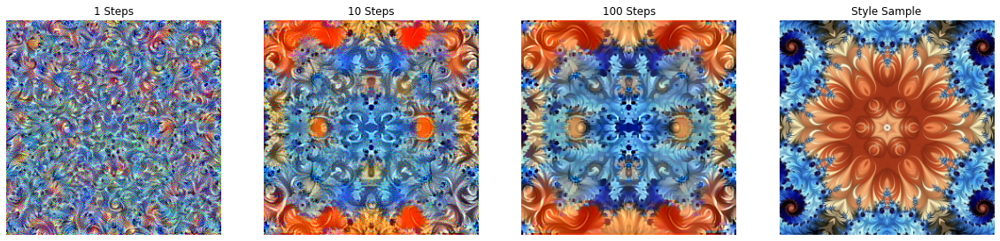

In [13]:
style_image = nst.utils.image.load_images('img/fractal.jpeg', min_dim=256)

imgen = nst.applications.ImageGenerator(
    tf.random.uniform((1,256,256,3), 0.0, 255.0),
    optimizer=tf.keras.optimizers.SGD(learning_rate=1.0, momentum=0.9),
    loss=nst.losses.Total([
            nst.losses.GatysStyle(style_image, model='vgg16:johnson2016'),
            nst.losses.Variation(),
            nst.losses.CrossCorrelation(style_image,
                [(id,Sx), (id,Sy)], model='vgg16')
        ], weights=[1.0, 1e-3, 1.0])
)
imgen(steps=100)

nst.utils.image.show_images(
    [ imgen.images[i-1] for i in [1,10,100] ] + [style_image],
    titles = [f'{i} Steps' for i in [1,10,100]] + ['Style Sample']
)

# Neural Style Transfer and Content Loss
Neural style transfer was first introduced by Gatys et al in their article _A Neural Algorithm of Artistic Style_ [2].  In a way it is a simple extension of texture synthesis:  It was known for some time that the deeper layers of a CNN do a good job of capturing the content of an image.  Gatys proposed to simply measure the content loss by the mean squared distance between the outputs of a chosen layer for the content image and the generated one as follows.

Let $\hat{F}$ be the content model output for the provided content image and $F$ that for the generated image.  The content loss is the mean squared error between the outputs:
$$ \mathcal{L}_C = \frac{1}{N_lM_l} \sum_{r,s} \big( F_{rs} - \hat{F}_{rs} \big)^2 \quad. $$

(I have, again, changed the normalization factor from Gatys' work.)

In my implementation of Gatys' content model in [`nstesia.models.GatysContent`](https://github.com/mdehling/nstesia/blob/main/models/gatys_content.py), the content layer is `block5_conv2` for VGG19 and `block3_conv3` for VGG16.  It is of course possible to choose other or more layers (and take the mean of their losses), but I have found these choices to work well enough.

As an example of neural style transfer, I will try to transfer the above `fractal` style onto a photo of a sunflower using a range of values for the content weight.

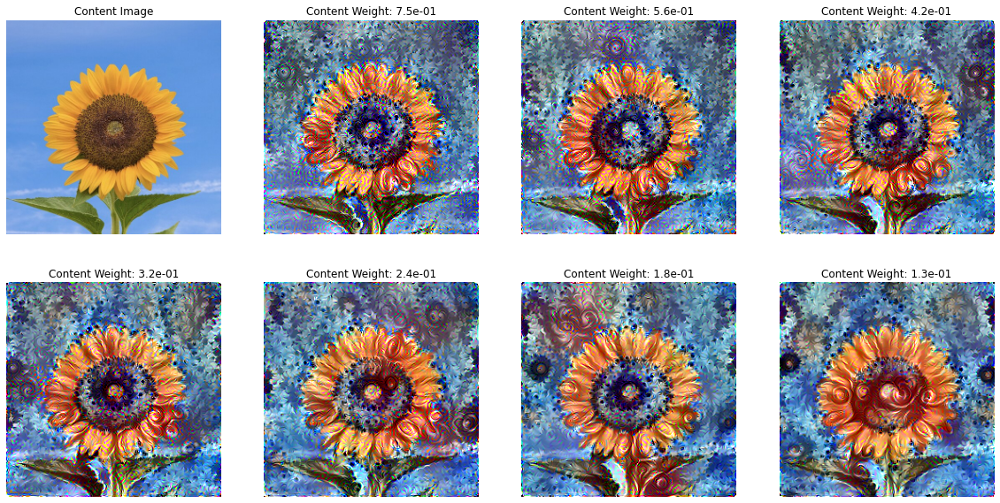

In [14]:
style_image = nst.utils.image.load_images('img/fractal.jpeg', min_dim=256)
content_image = nst.utils.image.load_images('img/sunflower.jpeg', min_dim=256)

imgens = []
content_weights = [10**(-(i+1)/8) for i in range(7)]
for content_weight in content_weights:
    imgen = nst.applications.ImageGenerator(
        tf.random.uniform((1,256,256,3), 0.0, 255.0),
        optimizer=tf.keras.optimizers.Adam(1.0),
        loss=nst.losses.Total([
            nst.losses.GatysStyle(style_image, model='vgg16:gatys2015b'),
            nst.losses.GatysContent(content_image, model='vgg16'),
            nst.losses.Variation(),
            ], weights=[1.0, content_weight, 1e-4])
    )
    imgen(steps=100)

    imgens.append(imgen)

nst.utils.image.show_images(
    [content_image] + [imgen.images[-1] for imgen in imgens],
    titles = ['Content Image'] + [ f'Content Weight: {content_weight:.1e}'
        for content_weight in content_weights ]
)

Out of these I like the stylized image with a content weight of around 2.4e-1 the most, so I'll generate a few more for that parameter.

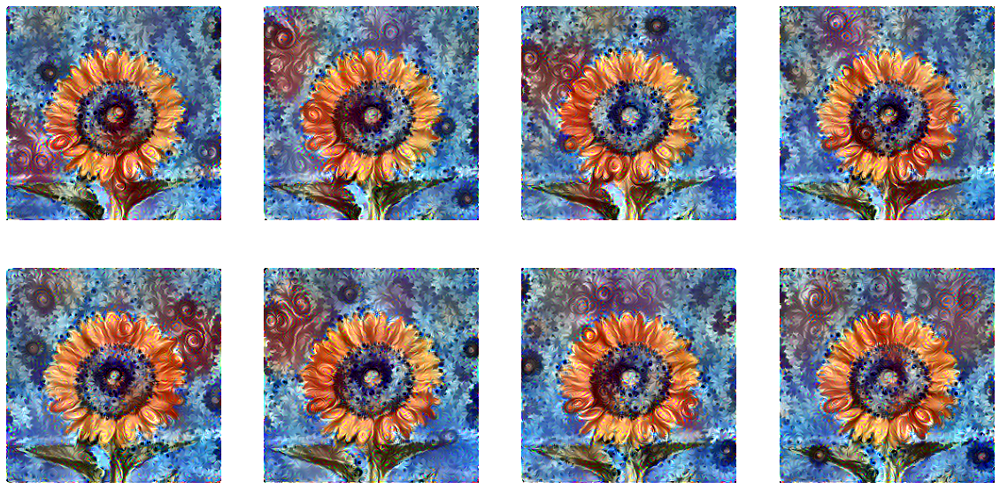

In [15]:
imgens = []
for i in range(8):
    imgen = nst.applications.ImageGenerator(
        tf.random.uniform((1,256,256,3), 0.0, 255.0),
        optimizer=tf.keras.optimizers.Adam(1.0),
        loss=nst.losses.Total([
            nst.losses.GatysStyle(style_image, model='vgg16:gatys2015b'),
            nst.losses.GatysContent(content_image, model='vgg16'),
            nst.losses.Variation(),
            ], weights=[1.0, 2.4e-1, 1e-4])
    )
    imgen(steps=100)

    imgens.append(imgen)

nst.utils.image.show_images(
    [imgen.images[-1] for imgen in imgens]
)

There is a bit of a cheap trick (due to Gatys et al) to obtain visually pleasing results more quickly: instead of starting from a randomly initialized image, one can choose to start from the content image itself.  Of course this will generate the same image every time, so one loses the variety from random initialization.

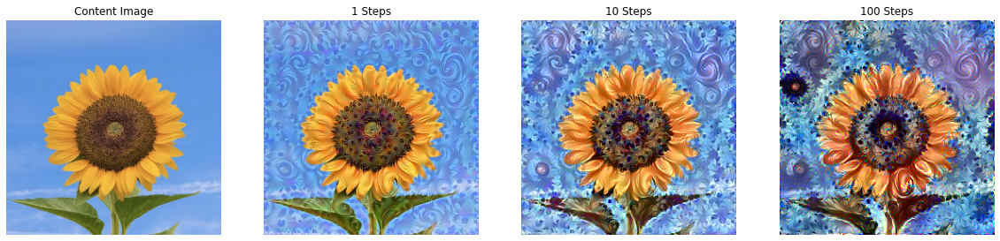

In [16]:
style_image = nst.utils.image.load_images('img/fractal.jpeg', min_dim=256)
content_image = nst.utils.image.load_images('img/sunflower.jpeg', min_dim=256)

imgen = nst.applications.ImageGenerator(
    content_image,
    optimizer=tf.keras.optimizers.Adam(0.3),
    loss=nst.losses.Total([
        nst.losses.GatysStyle(style_image, model='vgg16:gatys2015b'),
        nst.losses.GatysContent(content_image, model='vgg16'),
        nst.losses.Variation(),
        ], weights=[1.0, 1e-1, 1e-4])
)
imgen(steps=100)
stylized_image = imgen.images[-1]

nst.utils.image.show_images(
    [content_image] + [ imgen.images[i-1] for i in [1,10,100] ],
    titles = ['Content Image'] + [f'{i} Steps' for i in [1,10,100]]
)

# Color Matching
Gatys et al proposed two ways of preserving the colors of the content image during style transfer in their article _Preserving Color in Neural Artistic Style Transfer_ [5].  The first approach is to apply style transfer to the luminance channel of the images only and then combining the resulting image with the chrominance channels of the content image.  The second option is to modify the style image to match the color histogram of the content image before applying neural style transfer.  I will give a quick demonstration of both approaches here.

**Luminance-Only Transfer.**
I have implemented conversion functions between RGB and YCbCr color spaces in [`nstesia.image`](https://github.com/mdehling/nstesia/blob/main/image/color.py).  The conversion is a simple linear transformation applied pixelwise.  In the original article a YIQ color model was used instead.  The results are the same since the chrominance plane (CbCr or IQ) is not modified in any way.  As mentioned above, the general approach is to apply style transfer to the luminance channel of the style and content images and combine the outcome with the chrominance plane of the content image.  Note that below after separating the luminance channel I convert it back to an RGB image (with zero chrominance.)  This is for technical reasons: the transfer model expects a 3-channel input image.

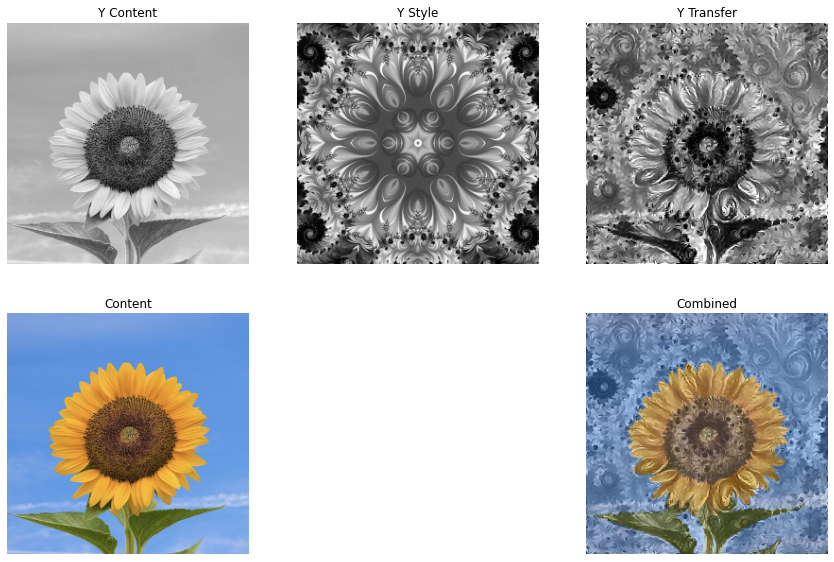

In [17]:
# Separate Y channel and CbCr plane and convert Y back to RGB (with 0 CbCr.)
style_y, _ = nst.image.rgb_to_y_cc(style_image)
style_y_as_rgb = nst.image.y_cc_to_rgb(style_y)
content_y, content_cc = nst.image.rgb_to_y_cc(content_image)
content_y_as_rgb = nst.image.y_cc_to_rgb(content_y)

# Style transfer just as before but for Y channel only.
imgen_l = nst.applications.ImageGenerator(
    content_image,
    optimizer=tf.keras.optimizers.Adam(0.3),
    loss=nst.losses.Total([
        nst.losses.GatysStyle(style_image, model='vgg16:gatys2015b'),
        nst.losses.GatysContent(content_image, model='vgg16'),
        nst.losses.Variation(),
        ], weights=[1.0, 1e-1, 1e-4])
)
imgen_l(steps=100)

# Use only the Y channel of the result.  Convert it to RGB for displaying, and
# combine with content CbCr for final result.
stylized_y, _ = nst.image.rgb_to_y_cc(imgen_l.images[-1])
stylized_y_as_rgb = nst.image.y_cc_to_rgb(stylized_y)
combined_stylized_image = nst.image.y_cc_to_rgb(stylized_y, content_cc)

nst.utils.image.show_images(
    [ content_y_as_rgb, style_y_as_rgb, stylized_y_as_rgb,
        content_image, None, combined_stylized_image ],
    titles = [ 'Y Content', 'Y Style', 'Y Transfer',
        'Content', None, 'Combined'],
    n_cols=3, width=14.7
)

Note that the luminance and chrominance channels don't form a perfect match.  This is a general problem with the luminance-transfer approach:  By construction, the colors match those of the content image but don't lign up perfectly with the transferred style/texture.

**Color Histogram Matching.**
The idea behind color histogram matching is to replace the style image $S$ by a modified style image $S'$ whose color histogram matches that of the content image $C$ in some sense.  Once that is done, one can apply neural style transfer to the pair $(S',C)$ instead of $(S,C)$ in the hope of better results.

Denote by $X_{ij}$ the pixels of an image as 3-vectors $(R,G,B)^T$. The approach here is to find and apply a pixelwise affine transformation $(A,b)$ to the style image $S$ such that the modified style image $S'$ with pixels $X_{S',ij} = A X_{S,ij} + b$ has mean and covariance matching that of the content image, i.e.,
$$ \mu_{S'} = \mu_C \quad\text{and}\quad \Sigma_{S'} = \Sigma_C \quad.$$
To find such an affine transformation, it is enough to choose a 3-by-3 matrix $A$ satisfying $A \Sigma_S A^T = \Sigma_C$ and let $b = \mu_C - A\mu_S$.

A solution can be obtained from the eigenvalue decomposition $\Sigma = U \Lambda U^T$ of the covariance matrices. Denote by $\Sigma^\frac{1}{2} = U \Lambda^\frac{1}{2} U^T$ and  $\Sigma^{-\frac{1}{2}} = U \Lambda^{-\frac{1}{2}} U^T$ the (inverse) square root of a covariance matrix.  Then
$$ A = \Sigma_C^{\frac{1}{2}} \Sigma_S^{-\frac{1}{2}} \quad\text{and}\quad b = \mu_C - A\mu_S $$
satisfy the above equations.  A proof of this statement can be found in Appendix B of Hertzmann's PhD thesis _Algorithms for Rendering in Artistic Styles_ [6].

I have implemented the above as a function [`nstesia.image.match_statistics`](https://github.com/mdehling/nstesia/blob/main/image/statistics.py) taking a source (the style image) and a target (the content image) and returning a modified version of the source image with statistics matching the target image.

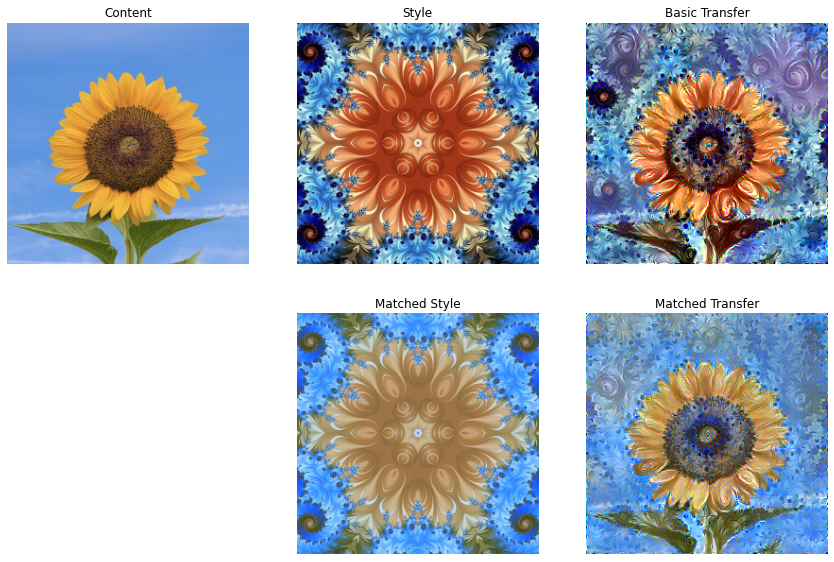

In [18]:
# Match image statistics.
matched_style_image = nst.image.match_statistics(style_image, content_image)

# Apply style transfer just as before but with matched style image.
imgen_m = nst.applications.ImageGenerator(
    content_image,
    optimizer=tf.keras.optimizers.Adam(0.3),
    loss=nst.losses.Total([
        nst.losses.GatysStyle(matched_style_image, model='vgg16:gatys2015b'),
        nst.losses.GatysContent(content_image, model='vgg16'),
        nst.losses.Variation(),
        ], weights=[1.0, 1e-1, 1e-4])
)
imgen_m(steps=100)
matched_stylized_image = imgen_m.images[-1]

nst.utils.image.show_images(
    [ content_image, style_image, stylized_image,
        None, matched_style_image, matched_stylized_image ],
    titles = ['Content', 'Style', 'Basic Transfer',
        None, 'Matched Style', 'Matched Transfer'],
    n_cols=3, width=14.7
)

**Comparison.**
Finally, these are the different results side by side for comparison.

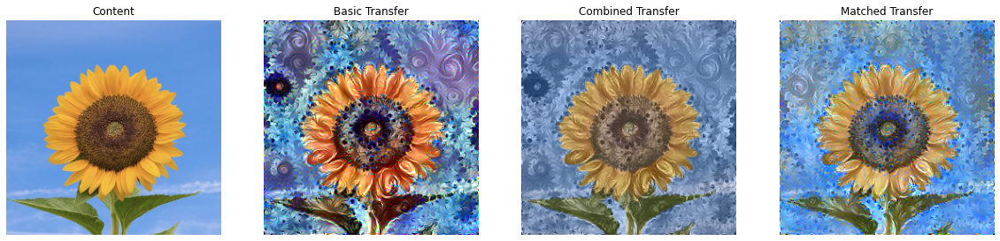

In [19]:
nst.utils.image.show_images(
    [ content_image, stylized_image, combined_stylized_image, matched_stylized_image ],
    [ 'Content', 'Basic Transfer', 'Combined Transfer', 'Matched Transfer']
)

# References
1. Gatys, Ecker, Bethge - _Texture Synthesis Using Convolutional Neural Networks_, 2015.
2. Gatys, Ecker, Bethge - _A Neural Algorithm of Artistic Style_, 2015.
3. Berger, Memisevic - _Incorporating Long-Range Consistency in CNN-Based Texture Generation_, 2017.
4. Gatys, Ecker, Bethge, Hertzmann, Shechtman - _Controlling Perceptual Factors in Neural Style Transfer_, 2017.
5. Gatys, Bethge, Hertzmann, Shechtman - _Preserving Color in Neural Artistic Style Transfer_, 2016.
6. Hertzmann - _Algorithms for Rendering in Artistic Styles_, 2001.